### Axel Pribadi TP061236
Improvements in Deepfake Detection (DF-GANeXt)

In [2]:
import os
import shutil

In [3]:
os.mkdir("/kaggle/working/code")
os.mkdir("/kaggle/working/model")
os.mkdir("/kaggle/working/output")
shutil.copyfile(src="/kaggle/input/models-with-code/code/convnext.py",
                dst="/kaggle/working/code/convnext.py")
shutil.copyfile(src="/kaggle/input/models-with-code/model/convnext_tiny_1k_224_ema.pth", 
                dst="/kaggle/working/model/convnext_tiny_1k_224_ema.pth")
os.chdir("/kaggle/working/code")

%config Completer.use_jedi = False

In [4]:
#!pip install torch torchvision torchaudio
#!pip install timm tensorboardX six
!pip install ipywidgets captum grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 53.5 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38247 sha256=c728b93dcbec5c7183e557d4f2763dc2de28fbb2a52411c247614d018b7d6e0a
  Stored in directory: /root/.cache/pip/wheels/a9/06/ad/719e3f7b39ac4ba44a1785de2b4c5a48dc5a2ace791f975c80
Successfully built grad-cam


In [5]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import random
import gc
import warnings
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm

import torch
import torchvision
from torch import optim
from torch.utils.data import DataLoader, Dataset, sampler
from torchvision import models
from torchvision import datasets, transforms
from convnext import ConvNeXt

from sklearn.metrics import accuracy_score, precision_recall_fscore_support

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from captum.attr import visualization as viz

In [7]:
# Set random seed number
def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

SEED = 123
seed_everything(SEED)

In [8]:
warnings.filterwarnings("ignore")
plt.rcParams.update({'axes.titlesize': 20})

In [9]:
class Args:
    def __init__(self) -> None:
        # data arguments
        self.num_classes = 2
        self.img_size = 256
        self.num_train_data = 10000
        self.num_test_data = 2000
        self.num_valid_data = 2000
        self.dataset_path = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/"
        
        # training arguments
        self.learning_rate = 1e-4
        self.epochs = 10
        self.scheduler = True
        self.sch_step_size = 2
        self.sch_gamma = 0.1
        
        # model arguments
        self.load_model_path = "/kaggle/working/model/convnext_tiny_1k_224_ema.pth"
        self.save_model_path = "/kaggle/working/output/convnext_tiny_1k_224_ema.pth"
        
        # output arguments
        self.output_path = "/kaggle/working/output/"

In [10]:
args = Args()

In [11]:
train_augmentations = transforms.Compose([
    transforms.RandomResizedCrop(args.img_size, scale=(0.6, 1.0), ratio=(3./ 4., 4. / 3.)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomVerticalFlip(0.1),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.2),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

test_augmentations = transforms.Compose([
    transforms.Resize(args.img_size),
    transforms.CenterCrop(args.img_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

basic_augmentations = transforms.Compose([
    transforms.Resize(args.img_size),
    transforms.CenterCrop(args.img_size),
    transforms.ToTensor()
])

In [12]:
# read train and test dataset
train_dataset = datasets.ImageFolder(root=args.dataset_path + "train/", transform=train_augmentations)
test_dataset = datasets.ImageFolder(root=args.dataset_path + "test/", transform=test_augmentations)

In [13]:
# select a subset of the train dataset
train_fake_all_indices = np.arange(len(train_dataset) / 2, dtype=np.int32)
train_fake_indices = np.random.choice(train_fake_all_indices, size=int(args.num_train_data / 2), replace=False)
train_real_indices = train_fake_indices + int(len(train_dataset) / 2)

train_indices = np.append(train_fake_indices, train_real_indices)

# select a subset of the test dataset
test_fake_all_indices = np.arange(len(test_dataset) / 2, dtype=np.int32)
test_fake_indices = np.random.choice(test_fake_all_indices, size=int(args.num_test_data / 2), replace=False)
test_real_indices = test_fake_indices + int(len(test_dataset) / 2)

test_indices = np.append(test_fake_indices, test_real_indices)

In [14]:
# sample the images from their respective dataset 
train_sampler = sampler.SubsetRandomSampler(train_indices)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, num_workers=2, sampler=train_sampler)
test_sampler = sampler.SubsetRandomSampler(test_indices)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=8, num_workers=2, sampler=test_sampler)

In [15]:
# define binary classes and their indices
classes = train_dataset.classes
class_to_idx = train_dataset.class_to_idx
idx_to_class = dict(zip(class_to_idx.values(), class_to_idx.keys()))

print(class_to_idx)
print(idx_to_class)

{'fake': 0, 'real': 1}
{0: 'fake', 1: 'real'}


In [16]:
raw_dataset = datasets.ImageFolder(root=args.dataset_path + "train/", transform=basic_augmentations)
valid_dataset = datasets.ImageFolder(root=args.dataset_path + "valid/", transform=basic_augmentations)

In [17]:
# Select random real and fake face images
indices = [random.randint(0, len(train_dataset)) for i in range(16)]

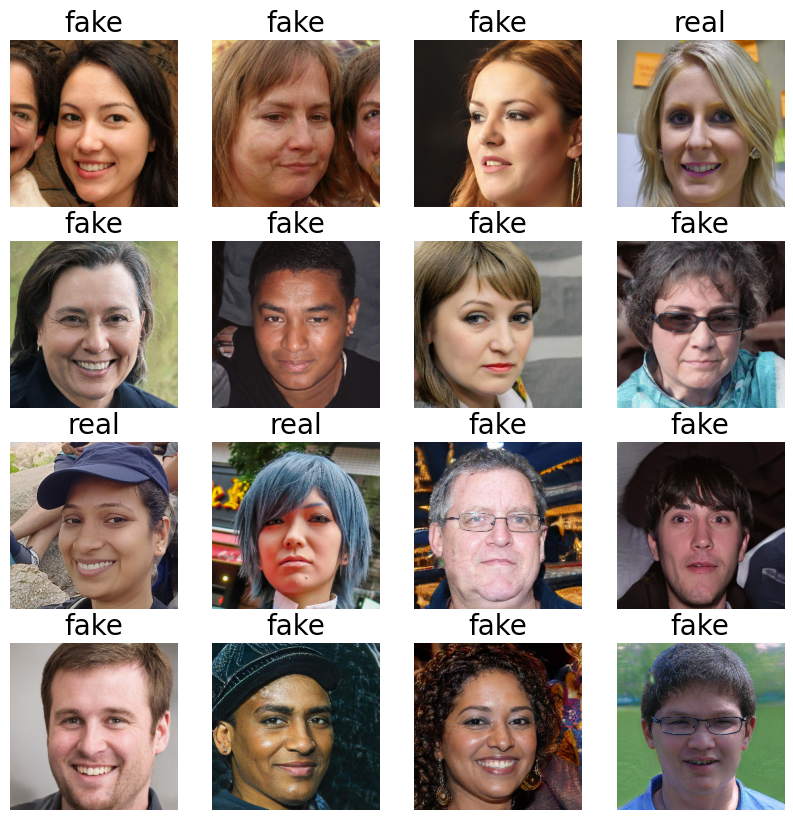

In [18]:
# Basic augmentations on raw_dataset
figure = plt.figure(figsize=(10,10))
for i in range(16):
    index = indices[i]
    img = raw_dataset[index][0].permute(1, 2, 0)
    label = idx_to_class[raw_dataset[index][1]]
    figure.add_subplot(4, 4, i + 1)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)

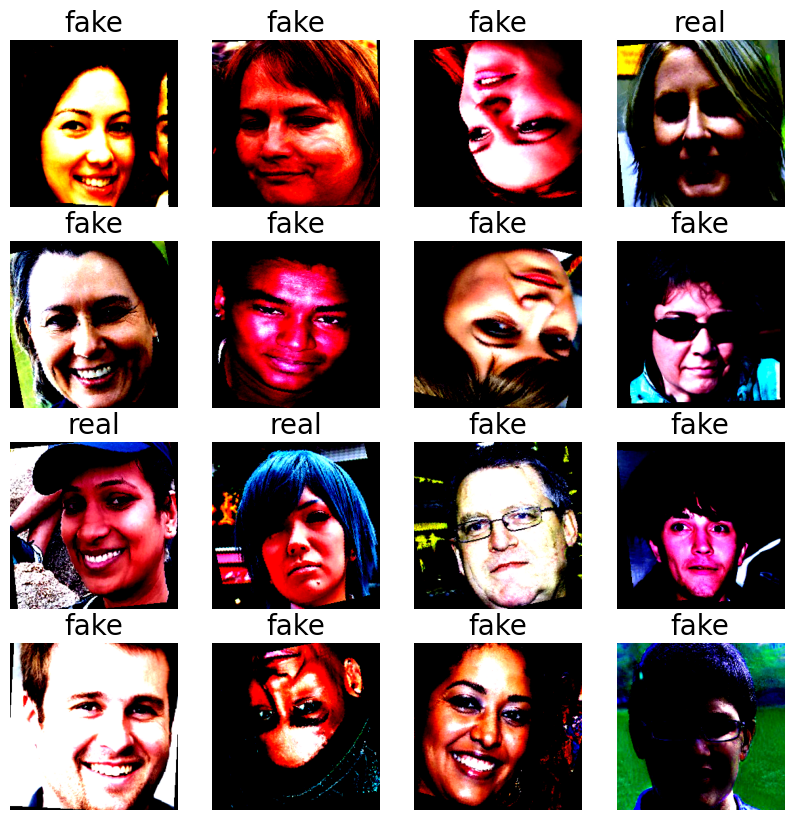

In [19]:
# Train augmentations on train_dataset
figure = plt.figure(figsize=(10,10))
for i in range(16):
    index = indices[i]
    img = train_dataset[index][0].permute(1, 2, 0)
    label = idx_to_class[train_dataset[index][1]]
    figure.add_subplot(4, 4, i + 1)
    plt.title(label)
    plt.axis("off")
    plt.imshow(img)

# Model

In [20]:
# Load ConvNeXt model
model = ConvNeXt()
state_dict = torch.load(args.load_model_path)
model.load_state_dict(state_dict["model"])

<All keys matched successfully>

In [21]:
model.parameters

<bound method Module.parameters of ConvNeXt(
  (downsample_layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm()
    )
    (1): Sequential(
      (0): LayerNorm()
      (1): Conv2d(96, 192, kernel_size=(2, 2), stride=(2, 2))
    )
    (2): Sequential(
      (0): LayerNorm()
      (1): Conv2d(192, 384, kernel_size=(2, 2), stride=(2, 2))
    )
    (3): Sequential(
      (0): LayerNorm()
      (1): Conv2d(384, 768, kernel_size=(2, 2), stride=(2, 2))
    )
  )
  (stages): ModuleList(
    (0): Sequential(
      (0): Block(
        (dwconv): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
        (norm): LayerNorm()
        (pwconv1): Linear(in_features=96, out_features=384, bias=True)
        (act): GELU(approximate='none')
        (pwconv2): Linear(in_features=384, out_features=96, bias=True)
        (drop_path): Identity()
      )
      (1): Block(
        (dwconv): Conv2d(96, 96, kernel_si

In [22]:
# Change to 2 output nodes for the classification (Real/Fake)
model.head = torch.nn.Linear(model.head.in_features, args.num_classes)

In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [24]:
model = model.to(device)

In [25]:
optimizer = optim.AdamW(model.parameters(), lr=args.learning_rate)

In [26]:
if args.scheduler:
    scheduler = optim.lr_scheduler.StepLR(optimizer, 
                                          step_size=args.sch_step_size, 
                                          gamma=args.sch_gamma)

In [27]:
loss_fn = torch.nn.CrossEntropyLoss()

In [28]:
train_acc, test_acc = [], []
train_precision, test_precision = [], []
train_recall, test_recall = [], []
train_f1, test_f1 = [], []
train_loss, test_loss = [], []

In [29]:
class LossBuffer:
    def __init__(self, mean=0, n=0):
        self.mean = mean
        self.n = n
        
    def add(self, num):
        self.mean = (self.mean * self.n + num) / (self.n + 1)
        self.n += 1

In [30]:
def train(model, dataloader, epoch):
    model.train()
    correct, cursum = 0, 0
    loop = tqdm(dataloader, total=len(dataloader))
    y_true, y_pred = [], []
    loss_buffer = LossBuffer()
    
    # Iterate over DataLoader
    for idx, (data, label) in enumerate(loop):
        data, label = data.to(device), label.to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        y_true.extend(label.cpu())
        y_pred.extend(pred.cpu())
        
        # Get accuracy
        acc = accuracy_score(y_true, y_pred)
        
        optimizer.zero_grad()
        loss = loss_fn(output, label) #loss = loss_fn(output.squeeze(), label.float())
        loss.backward()
        optimizer.step()
        loss_buffer.add(loss.item())
          
        loop.set_description(f"[Epoch {epoch}/{args.epochs}]")
        loop.set_postfix(LOSS="{:.6f}".format(loss_buffer.mean), ACC="{:.2f}%".format(100 * acc))
    
    # Update learning rate
    if args.scheduler:
        scheduler.step()
    
    # Get precision/recall/f1 scores
    precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
    torch.save(model.state_dict(), args.save_model_path)
    
    train_acc.append(acc)
    train_precision.append(precision)
    train_recall.append(recall)
    train_f1.append(f1)
    train_loss.append(loss_buffer.mean)

In [31]:
def test(model, dataloader, epoch):
    model.eval()
    correct = 0
    y_true, y_pred = [], []
    
    with torch.no_grad():
        total_len = len(dataloader.dataset)
        loss_buffer = LossBuffer()
        
        # Iterate over DataLoader
        for idx, (data, label) in enumerate(dataloader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            y_true.extend(label.cpu())
            y_pred.extend(pred.cpu())
            loss = loss_fn(output, label) #loss = loss_fn(output.squeeze(), label.float())
            loss_buffer.add(loss.item())
        
        # Get accuracy/precision/recall/f1 scores
        acc = accuracy_score(y_true, y_pred)
        precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
    
    print("\n" + "-" * 60)
    print("[Epoch {}/{}]:  Test -> LOSS: {:.6f}  |  Accuracy: {:.2f}%".format(epoch, args.epochs, loss_buffer.mean, 100 * acc))
    print("-" * 60 + "\n")
    
    test_acc.append(acc)
    test_precision.append(precision)
    test_recall.append(recall)
    test_f1.append(f1)
    test_loss.append(loss_buffer.mean)

In [32]:
args.epochs = 4

In [33]:
for epoch in range(1,args.epochs+1):
    train(model, train_loader, epoch)
    test(model, test_loader, epoch)

  0%|          | 0/625 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 1/4]:  Test -> LOSS: 0.192345  |  Accuracy: 92.20%
------------------------------------------------------------



  0%|          | 0/625 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 2/4]:  Test -> LOSS: 0.037857  |  Accuracy: 98.75%
------------------------------------------------------------



  0%|          | 0/625 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 3/4]:  Test -> LOSS: 0.027608  |  Accuracy: 99.05%
------------------------------------------------------------



  0%|          | 0/625 [00:00<?, ?it/s]


------------------------------------------------------------
[Epoch 4/4]:  Test -> LOSS: 0.017063  |  Accuracy: 99.50%
------------------------------------------------------------



In [34]:
dic = {
    "train_loss"     : train_loss,
    "test_loss"      : test_loss,
    "train_acc"      : train_acc,
    "test_acc"       : test_acc,
    "train_precision": train_precision,
    "test_precision" : test_precision,
    "train_recall"   : train_recall,
    "test_recall"    : test_recall,
    "train_f1"       : train_f1,
    "test_f1"        : test_f1,
}

In [35]:
# print and save results
for key, value in dic.items():
    print(key + ": " + str(value), "\n")
    np.savetxt(args.output_path + key + ".txt", value)

train_loss: [0.32560639437735034, 0.11697961973510683, 0.03732227207701658, 0.028972184966737376] 

test_loss: [0.19234469089098274, 0.03785697631817311, 0.027607554321992207, 0.017062538864673116] 

train_acc: [0.8481, 0.9572, 0.9878, 0.9896] 

test_acc: [0.922, 0.9875, 0.9905, 0.995] 

train_precision: [0.8481702050401444, 0.9572457245724573, 0.9878003121921997, 0.9896019584078336] 

test_precision: [0.9317135549872123, 0.987582401425841, 0.9905397337184313, 0.9950178206415431] 

train_recall: [0.8481, 0.9572, 0.9878, 0.9896] 

test_recall: [0.922, 0.9875, 0.9905, 0.995] 

train_f1: [0.8480923423349772, 0.9571989299732493, 0.9877999980479997, 0.9895999895999895] 

test_f1: [0.9215587680703958, 0.9874994718526857, 0.9904998076211043, 0.994999954999595] 



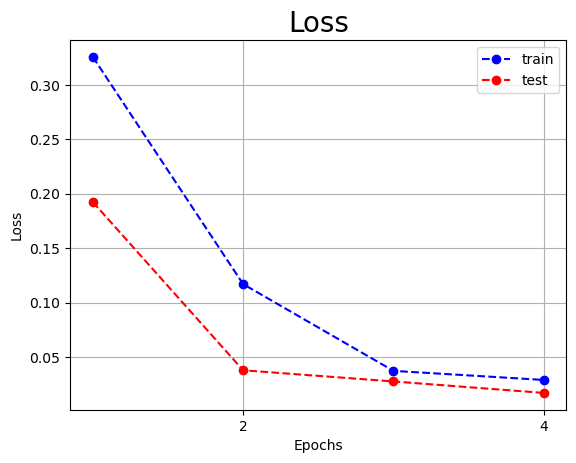

In [36]:
# plot loss
plt.plot(np.arange(1, args.epochs + 1), np.array(train_loss), 'bo--')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_loss), 'ro--')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.grid(True)
plt.legend(["train", "test"], loc="upper right")
#plt.savefig("../output/Loss.png", dpi=600)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss")

plt.show()

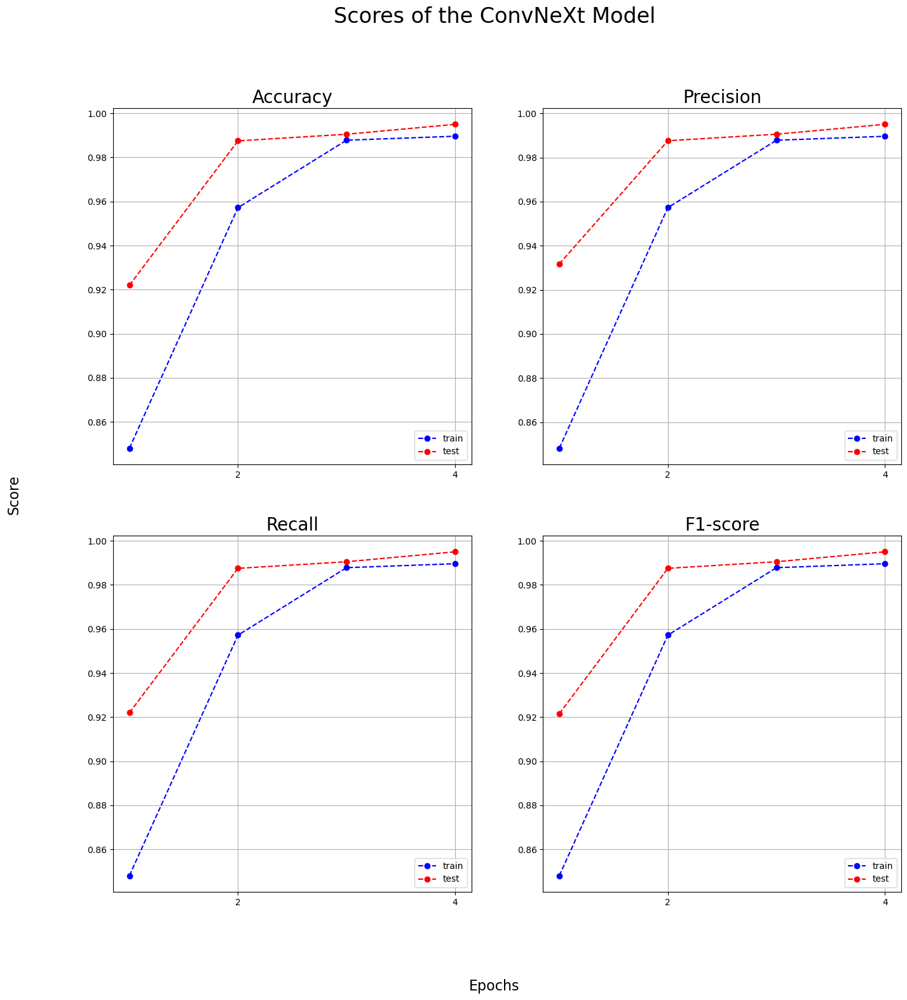

In [37]:
figure = plt.figure(figsize=(16,16))

# plot accuracy
figure.add_subplot(2, 2, 1)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_acc), 'bo--')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_acc), 'ro--')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Accuracy")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
#plt.savefig("../output/Accuracy.png", dpi=600)

# plot precision
figure.add_subplot(2, 2, 2)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_precision), 'bo--')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_precision), 'ro--')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Precision")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
#plt.savefig("../output/Precision.png", dpi=600)

# plot recall
figure.add_subplot(2, 2, 3)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_recall), 'bo--')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_recall), 'ro--')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("Recall")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
#plt.savefig("../output/Recall.png", dpi=600)

# plot F1-score
figure.add_subplot(2, 2, 4)
plt.plot(np.arange(1, args.epochs + 1), np.array(train_f1), 'bo--')
plt.plot(np.arange(1, args.epochs + 1), np.array(test_f1), 'ro--')
plt.xticks(np.arange(2, args.epochs + 1, 2))
plt.title("F1-score")
plt.grid(True)
plt.legend(["train", "test"], loc="lower right")
#plt.savefig("../output/F1-score.png", dpi=600)

figure.supxlabel('Epochs', size = 16)
figure.supylabel('Score', size = 16)
figure.suptitle("Scores of the ConvNeXt Model", size = 24)
plt.show()

In [38]:
def showprediction(indices):
    figure = plt.figure(figsize=(16, 16))
    for i in range(16):
        index = indices[i]
        data, true_label = valid_dataset[index]
        true_label = idx_to_class[true_label]
        img = data.permute(1, 2, 0)
        data = data.unsqueeze(0).to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        pred_label = idx_to_class[pred.item()]
        figure.add_subplot(4, 4, i + 1)
        plt.title(true_label + " -> " + pred_label)
        plt.axis("off")
        plt.imshow(img)

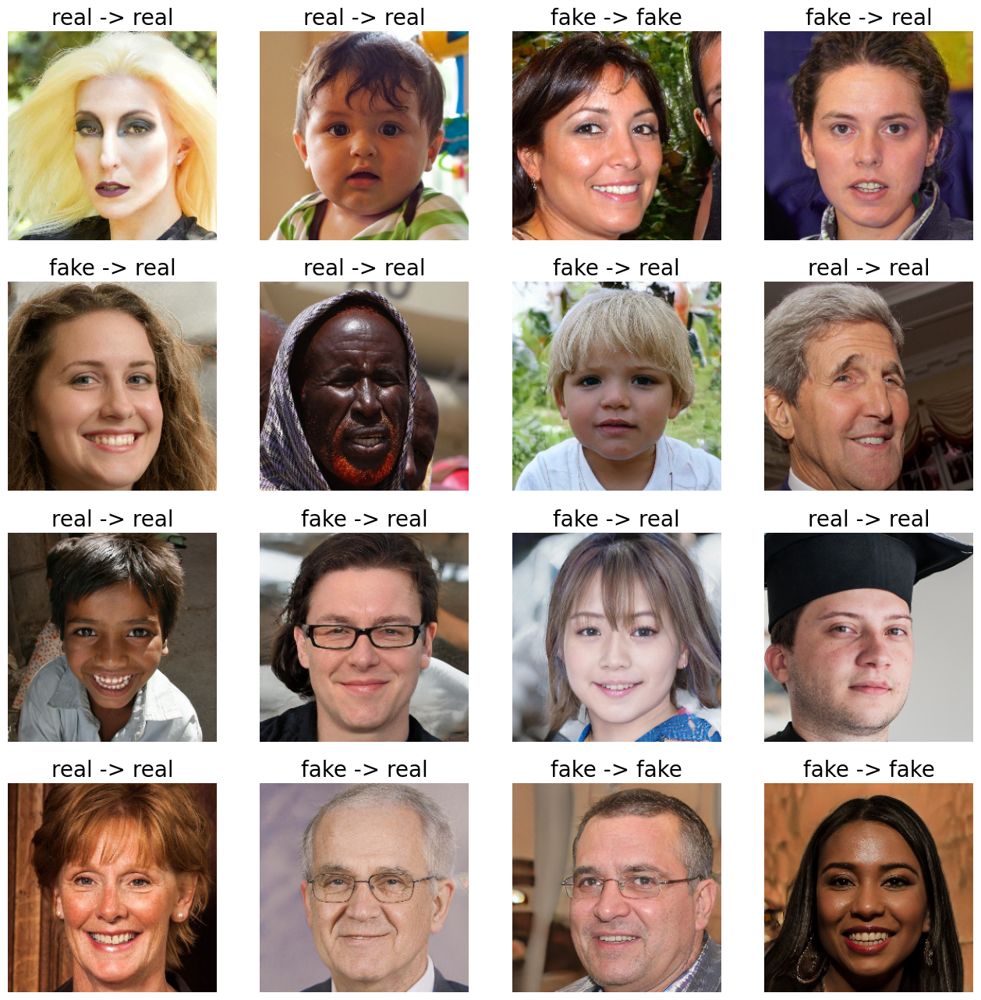

In [39]:
indices = [random.randint(0, len(valid_dataset)) for i in range(16)]
showprediction(indices)

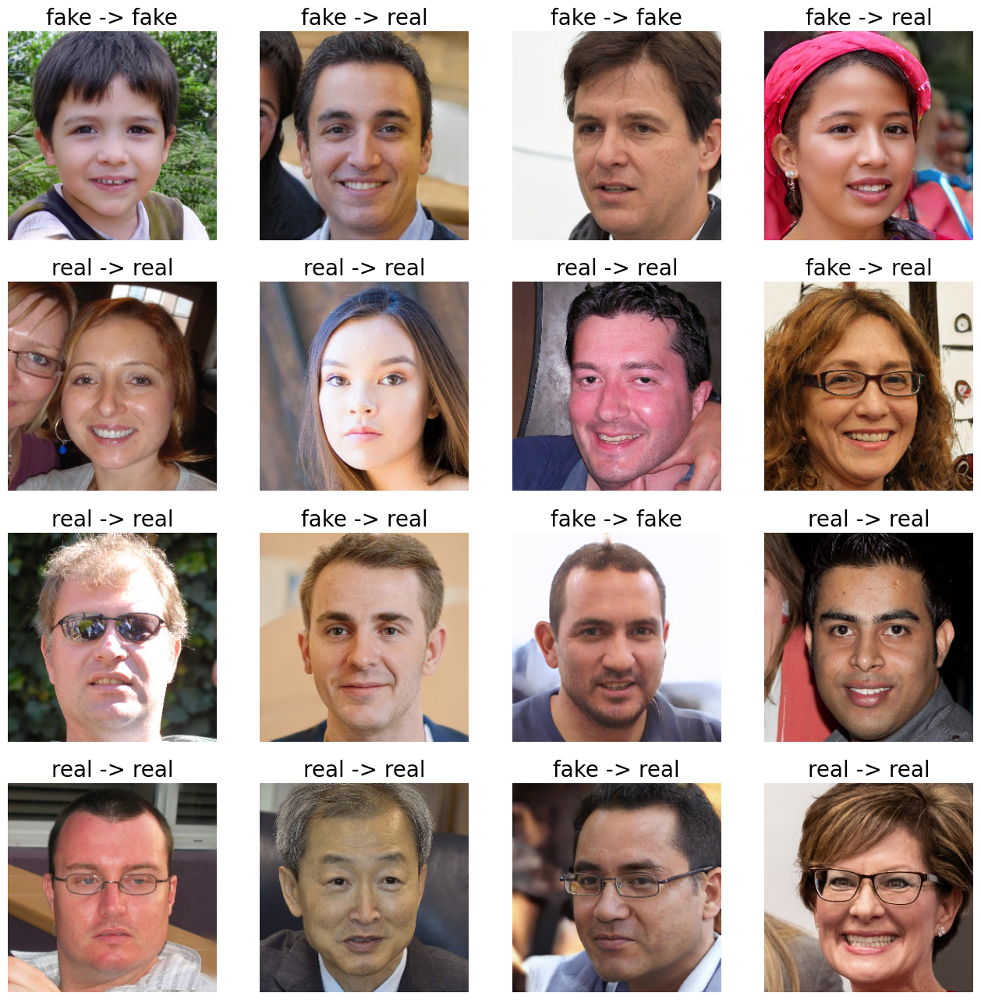

In [40]:
indices = [random.randint(0, len(valid_dataset)) for i in range(16)]
showprediction(indices)

In [41]:
valid_fake_all_indices = np.arange(len(valid_dataset) / 2, dtype=np.int32)
valid_fake_indices = np.random.choice(valid_fake_all_indices, size=int(args.num_valid_data / 2), replace=False)
valid_real_indices = valid_fake_indices + int(len(valid_dataset) / 2)

valid_indices = np.append(valid_fake_indices, valid_real_indices)

In [42]:
len(valid_indices)

2000

In [43]:
def ShowPred(indices):
    y_true, y_pred = [],[]
    for i in range(len(indices)):
        index = indices[i]
        data, true_label = valid_dataset[index]
        img = data.permute(1, 2, 0)
        data = data.unsqueeze(0).to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        pred_label = pred.item()
        
        y_true.append(true_label)
        y_pred.append(pred_label)
    
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
    
    return acc, prec, rec, f1

'''
def valid_eval(indices):
    for i in range(x):
        index = indices[i]
        data, true_label = valid_dataset[index]
        true_label = idx_to_class[true_label]
        img = data.permute(1, 2, 0)
        data = data.unsqueeze(0).to(device)
        output = model(data)
        pred = output.argmax(dim=1)
        pred_label = idx_to_class[pred.item()]
'''


'\ndef valid_eval(indices):\n    for i in range(x):\n        index = indices[i]\n        data, true_label = valid_dataset[index]\n        true_label = idx_to_class[true_label]\n        img = data.permute(1, 2, 0)\n        data = data.unsqueeze(0).to(device)\n        output = model(data)\n        pred = output.argmax(dim=1)\n        pred_label = idx_to_class[pred.item()]\n'

In [44]:
valid_true, valid_pred = [], []
valid_acc, valid_precision, valid_recall, valid_f1 = ShowPred(valid_indices)

In [45]:
print(valid_acc, valid_precision, valid_recall, valid_f1)

0.7275 0.8236245954692556 0.7275 0.7056420850802395


In [46]:
valid2_dataset = datasets.ImageFolder(root=args.dataset_path + "valid/", transform=train_augmentations)

In [47]:
valid2_fake_all_indices = np.arange(len(valid2_dataset) / 2, dtype=np.int32)
valid2_fake_indices = np.random.choice(valid2_fake_all_indices, size=int(args.num_valid_data / 2), replace=False)
valid2_real_indices = valid2_fake_indices + int(len(valid2_dataset) / 2)

valid2_indices = np.append(valid2_fake_indices, valid2_real_indices)

In [48]:
valid2_acc, valid2_precision, valid2_recall, valid2_f1 = ShowPred(valid2_indices)
print(valid2_acc, valid2_precision, valid2_recall, valid2_f1)

0.7375 0.8278688524590163 0.7375 0.7180735022654808


# UNDERSTANDING THE IMAGES AND ITS FEATURES

In [49]:
model.stages[-1]

Sequential(
  (0): Block(
    (dwconv): Conv2d(768, 768, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=768)
    (norm): LayerNorm()
    (pwconv1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (pwconv2): Linear(in_features=3072, out_features=768, bias=True)
    (drop_path): Identity()
  )
  (1): Block(
    (dwconv): Conv2d(768, 768, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=768)
    (norm): LayerNorm()
    (pwconv1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (pwconv2): Linear(in_features=3072, out_features=768, bias=True)
    (drop_path): Identity()
  )
  (2): Block(
    (dwconv): Conv2d(768, 768, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=768)
    (norm): LayerNorm()
    (pwconv1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (pwconv2): Linear(in_features=3072, out_features=768, bias=True)
    (d

In [50]:
gradcam_indices = [random.randint(0, len(valid_dataset)) for i in range(16)]

In [51]:
def gradcam_check(indices):
    figure = plt.figure(figsize=(16, 16))
    for i in range(16):
        # Get the last convolutional layers
        target_layer = [model.stages[-1]]
        
        index = indices[i]
        data, label = valid_dataset[index]
        data = data.unsqueeze(0).to(device)
        rgb_img = np.transpose(data.cpu().numpy().squeeze(0), (1, 2, 0))
        
        # Predict output
        output = model(data)
        pred = output.argmax(dim=1)
        pred_label = idx_to_class[pred.item()]

        # Perform GradCAM
        cam = GradCAMPlusPlus(model=model, target_layers=target_layer, use_cuda=True)
        grayscale_cam = cam(input_tensor=data, aug_smooth=True)[0]
        cam_img = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        # Create a new subplot for each image
        subplot = figure.add_subplot(4, 4, i + 1)
        subplot.set_title(idx_to_class[label] +" -> " + pred_label)
        subplot.axis("off")
        subplot.imshow(cam_img)

    plt.tight_layout()
    plt.show()

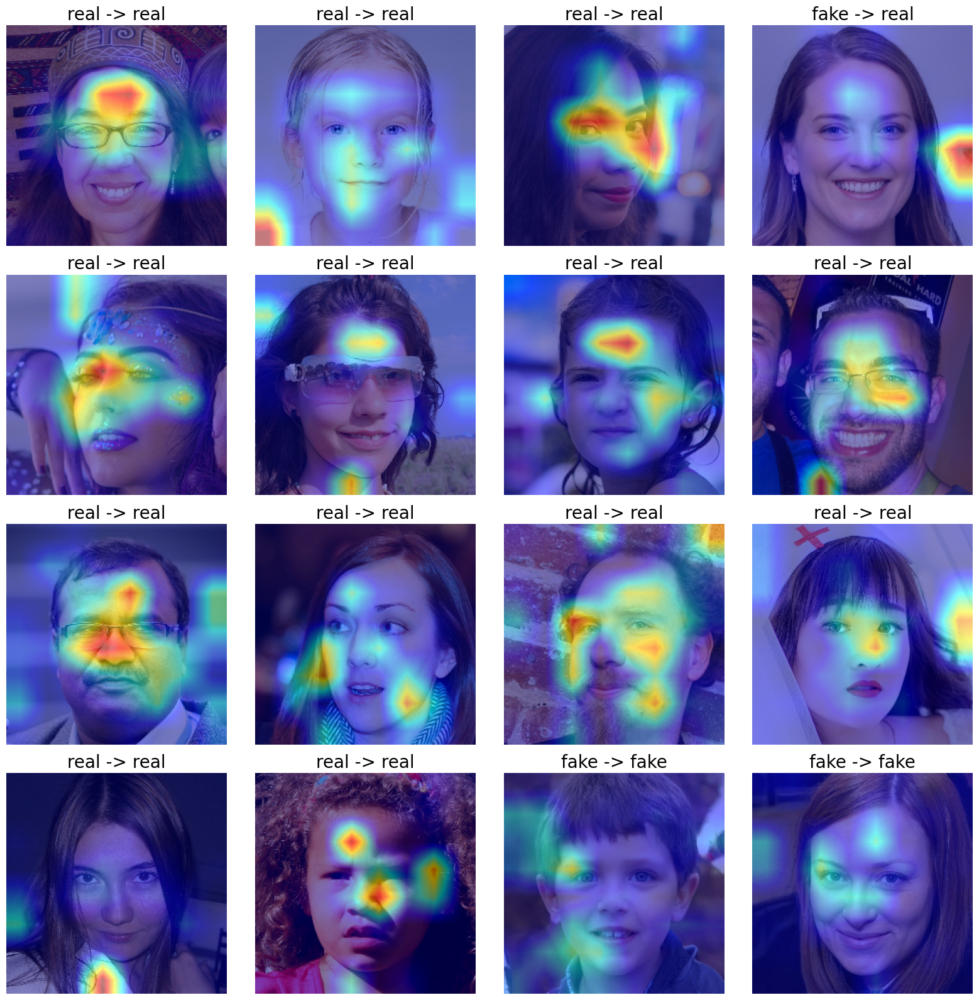

In [52]:
gradcam_check(gradcam_indices)

In [53]:
grad_fake = [random.randint(0, len(valid_dataset)/2) for i in range(16)]
grad_real = [random.randint(len(valid_dataset)/2, len(valid_dataset)) for i in range(16)]

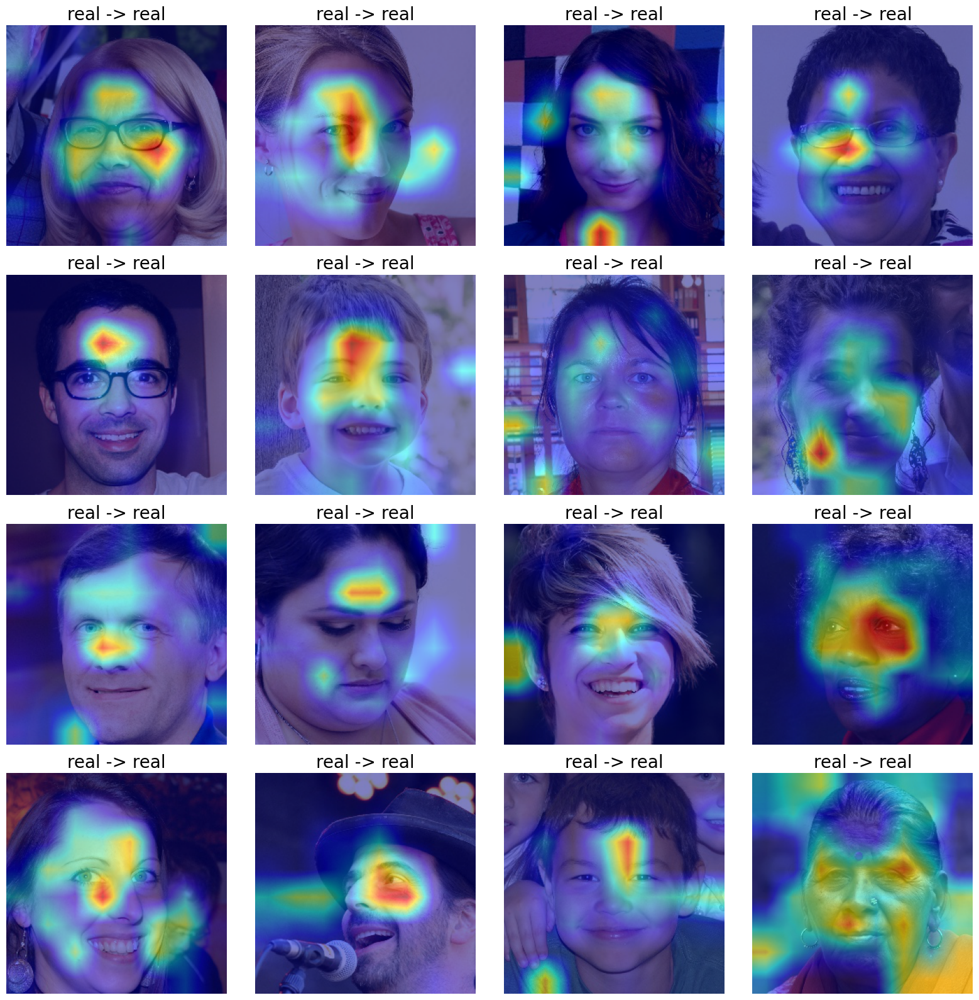

In [54]:
gradcam_check(grad_real)

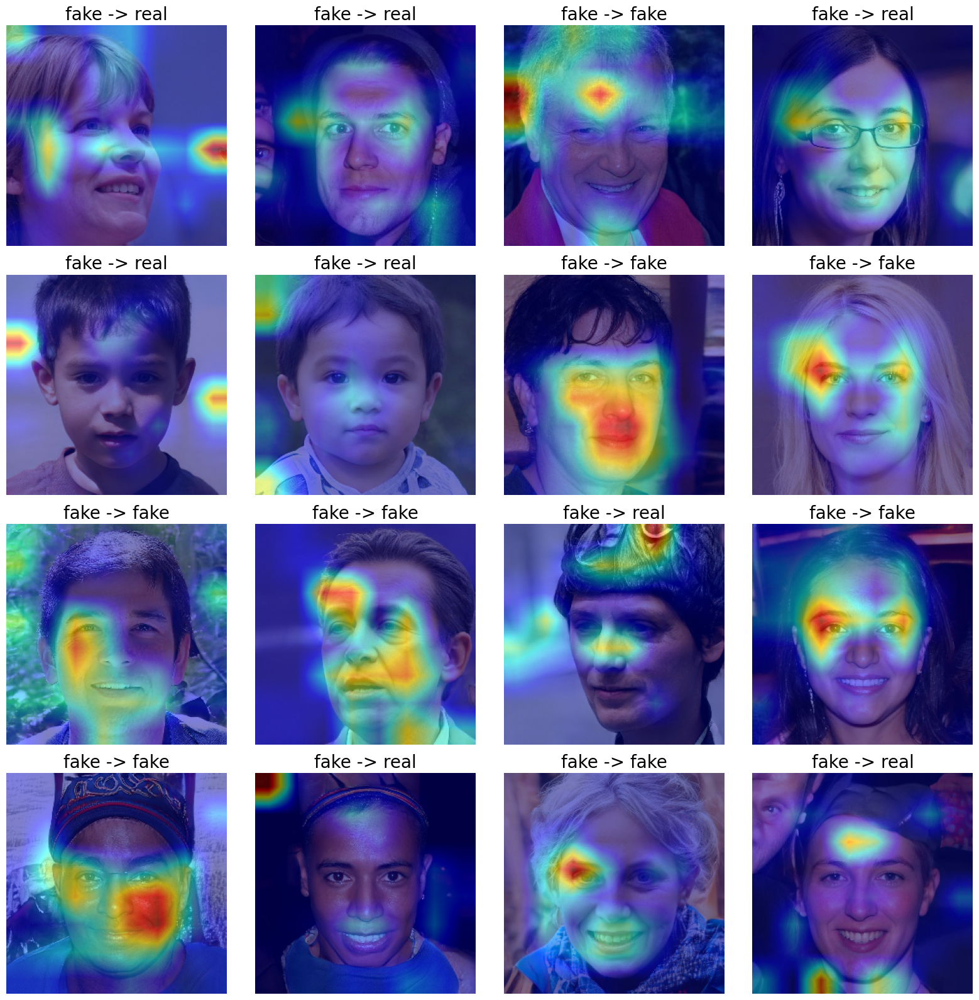

In [55]:
gradcam_check(grad_fake)

In [56]:
model.zero_grad()
model.eval();